<a href="https://colab.research.google.com/github/poojatambe/Segmentation_models_on_custom_data/blob/main/Segment_anything.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import torch
import torchvision

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import sys

In [5]:
!pip install git+https://github.com/facebookresearch/segment-anything.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-71bjez2r
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-71bjez2r
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 567662b0fd33ca4b022d94d3b8de896628cd32dd
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36610 sha256=b571ae74c438e0fe61f57ca94f00a8fd5ebd8587a22ebff1c720c5d4e9021124
  Stored in directory: /tmp/pip-ephem-wheel-cache-qvi1bv20/wheels/d5/11/03/7aca746a2c0e09f279b10436ced7175926bc38f650b736a648
Successfully built segment-anything


In [6]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth

--2023-04-23 16:34:56--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 108.157.162.83, 108.157.162.120, 108.157.162.108, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|108.157.162.83|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1249524607 (1.2G) [binary/octet-stream]
Saving to: ‘sam_vit_l_0b3195.pth’

sam_vit_l_0b3195.pt 100%[===================>]   1.16G  20.4MB/s    in 16s     

2023-04-23 16:35:12 (72.8 MB/s) - ‘sam_vit_l_0b3195.pth’ saved [1249524607/1249524607]



In [7]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

In [9]:
img= cv2.imread('/content/image.jpg')
img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [11]:
model_type='vit_l'
checkpoint= '/content/sam_vit_l_0b3195.pth'

In [13]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))  

# With Point Prompt

In [14]:
from segment_anything import SamPredictor, sam_model_registry
sam = sam_model_registry[model_type](checkpoint=checkpoint)
# Initialize SAM model
predictor = SamPredictor(sam)
# Generate input image embeddings.
predictor.set_image(img)

In [15]:
input_point = np.array([[76, 366]])
input_label = np.array([1])

In [16]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True, # generate multiple mask outputs
)

In [17]:
masks.shape

(3, 562, 750)

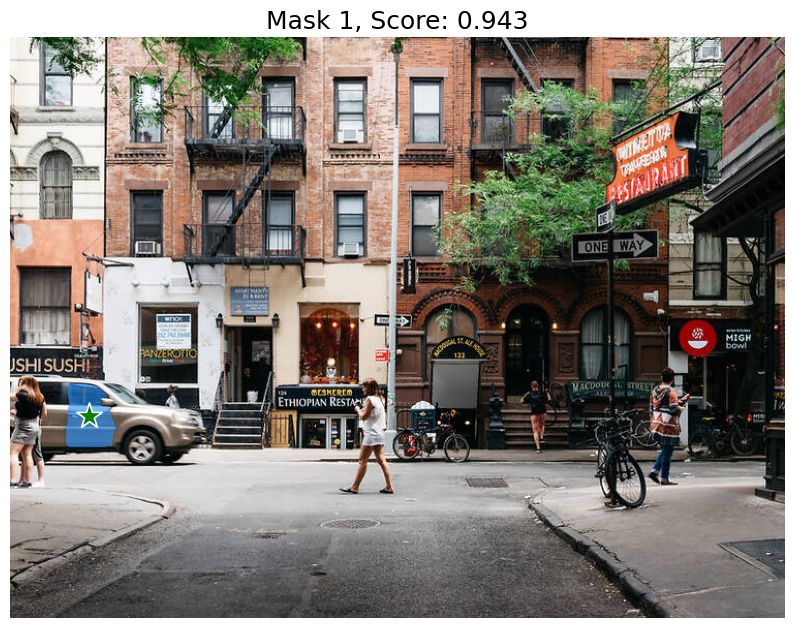

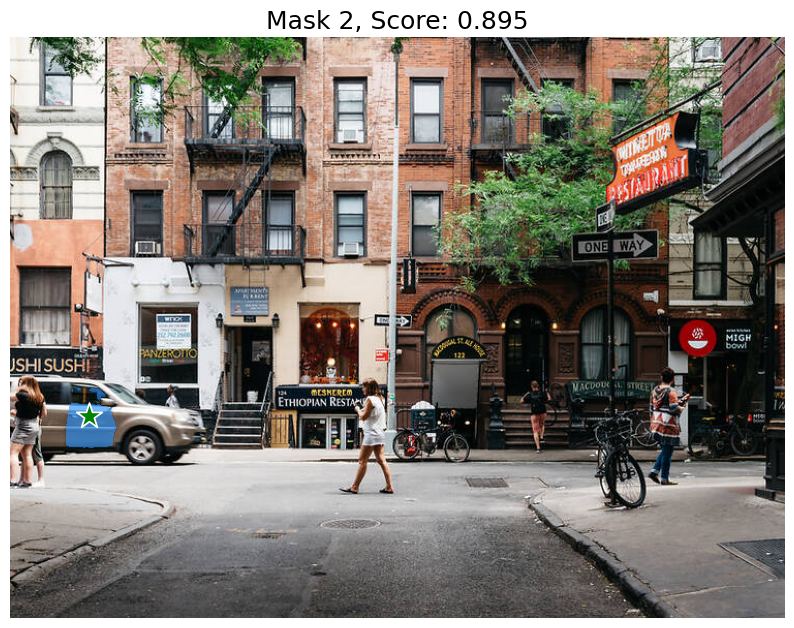

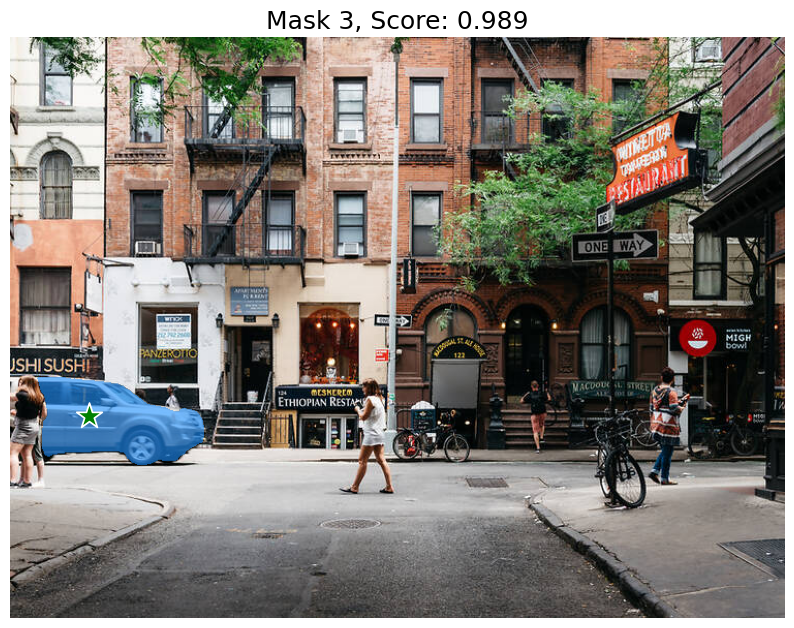

In [18]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

In [19]:
# multiple points are provides for single object
input_point = np.array([[76, 366], [172, 395]])
input_label = np.array([1, 1])

# if previous prediction mask is available we could use pass it to model for prediction.
mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [20]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

In [22]:
masks.shape

(1, 562, 750)

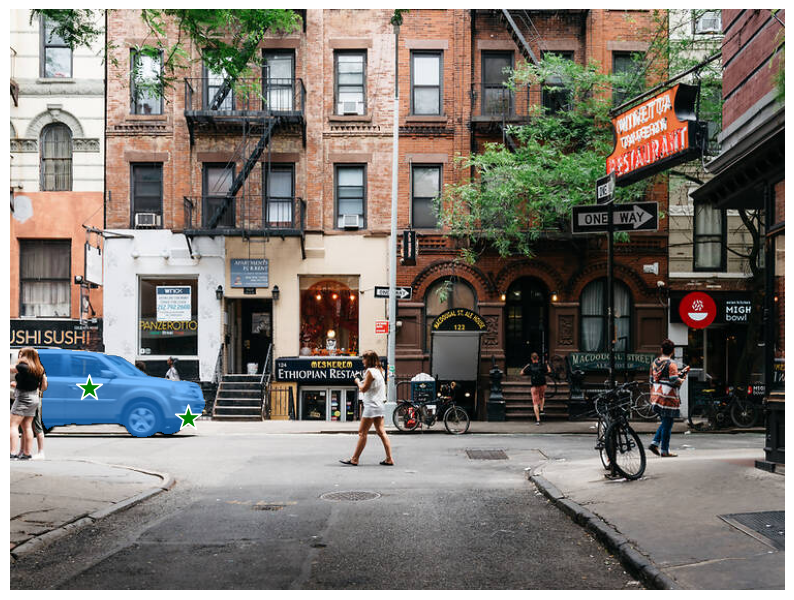

In [24]:
plt.figure(figsize=(10,10))
plt.imshow(img)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show() 

In [25]:
# multiple points for single object without previous predicted mask.
input_point = np.array([[76, 366], [172, 395]])
input_label = np.array([1, 1])

In [26]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=False,
)

In [27]:
masks.shape

(1, 562, 750)

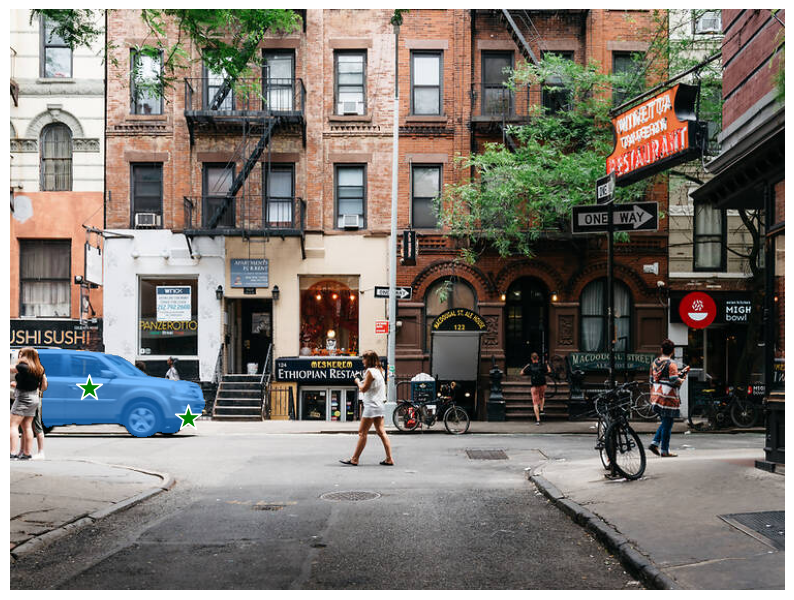

In [28]:
plt.figure(figsize=(10,10))
plt.imshow(img)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show() 

In [52]:
# here we have focused on car tire and not complete car.
#  Hence 1 will indicate foreground object and 0 as background.
input_point = np.array([[128, 398], [131, 368]])
input_label = np.array([1, 0])

In [53]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=False,
)

In [54]:
masks.shape

(1, 562, 750)

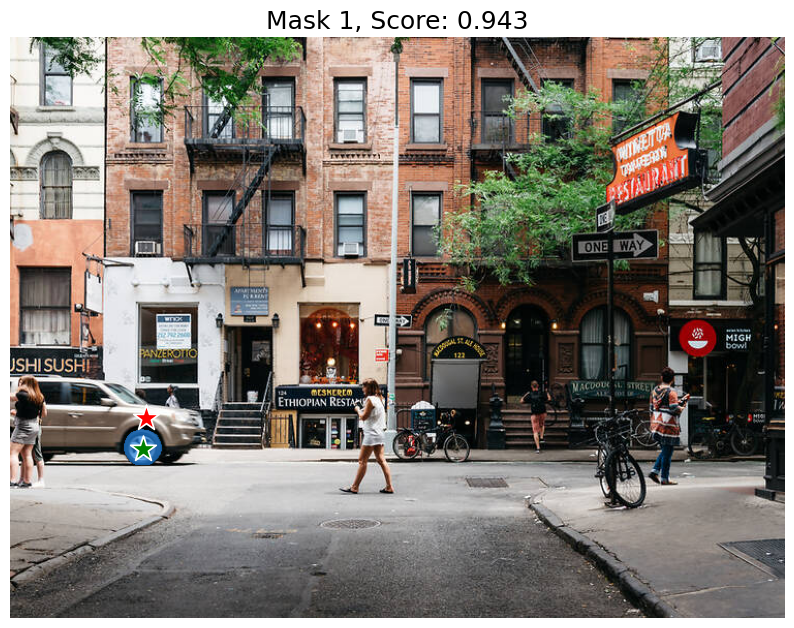

In [55]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

## With box prompt

In [56]:
input_box=np.array([616, 320, 661, 437])

In [57]:
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

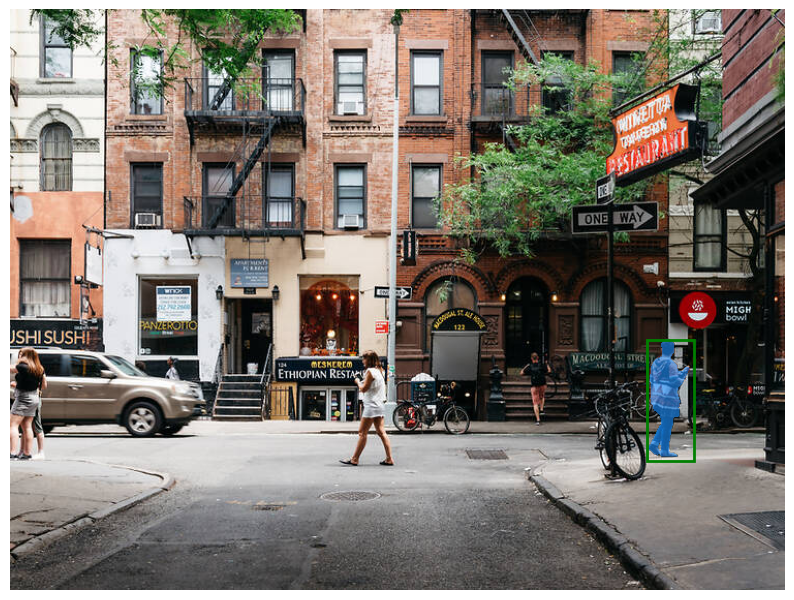

In [59]:
plt.figure(figsize=(10, 10))
plt.imshow(img)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('off')
plt.show()

In [60]:
input_boxes = torch.tensor([
    [616, 320, 661, 437],
    [324, 331, 376, 448],
    [310, 151, 347, 215],
    [32, 330, 200, 416],
])

In [62]:
transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes, img.shape[:2])
masks, _, _ = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

In [63]:
masks.shape

torch.Size([4, 1, 562, 750])

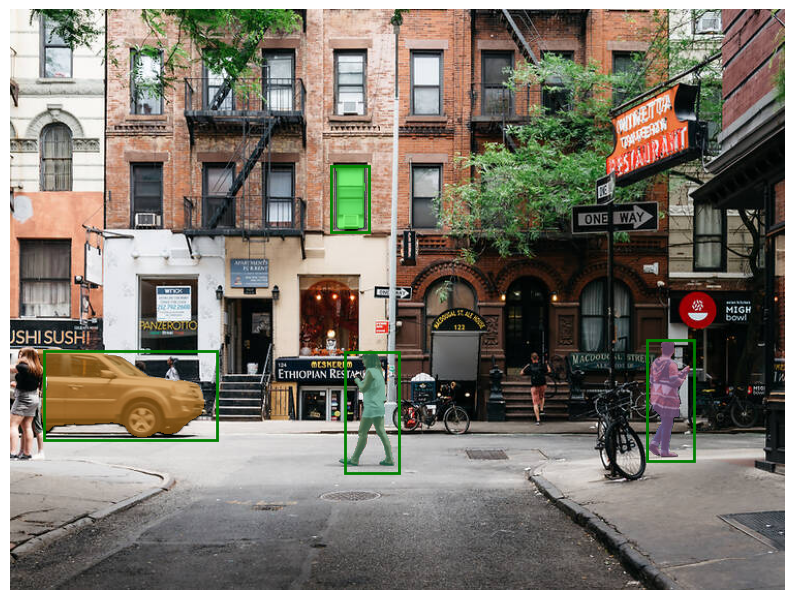

In [65]:
plt.figure(figsize=(10, 10))
plt.imshow(img)
for mask in masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box.cpu().numpy(), plt.gca())
plt.axis('off')
plt.show()

## Automatic Generating object Mask

In [1]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)
    polygons = []
    color = []
    for ann in sorted_anns:
        m = ann['segmentation']
        img = np.ones((m.shape[0], m.shape[1], 3))
        color_mask = np.random.random((1, 3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
        ax.imshow(np.dstack((img, m*0.35)))

In [8]:
image = cv2.imread('/content/image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [9]:
model_type='vit_l'
checkpoint= '/content/sam_vit_l_0b3195.pth'

In [12]:
from segment_anything import SamAutomaticMaskGenerator, sam_model_registry
sam = sam_model_registry[model_type](checkpoint=checkpoint)
# Generate input image embeddings.
predictor.set_image(image)

In [13]:
mask_generator = SamAutomaticMaskGenerator(sam)

In [14]:
masks = mask_generator.generate(image)

Mask generation returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:

segmentation : the mask

area : the area of the mask in pixels

bbox : the boundary box of the mask in XYWH format

predicted_iou : the model's own prediction for the quality of the mask

point_coords : the sampled input point that generated this mask

stability_score : an additional measure of mask quality

crop_box : the crop of the image used to generate this mask in XYWH format

In [15]:
print(len(masks))
print(masks[0].keys())

172
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


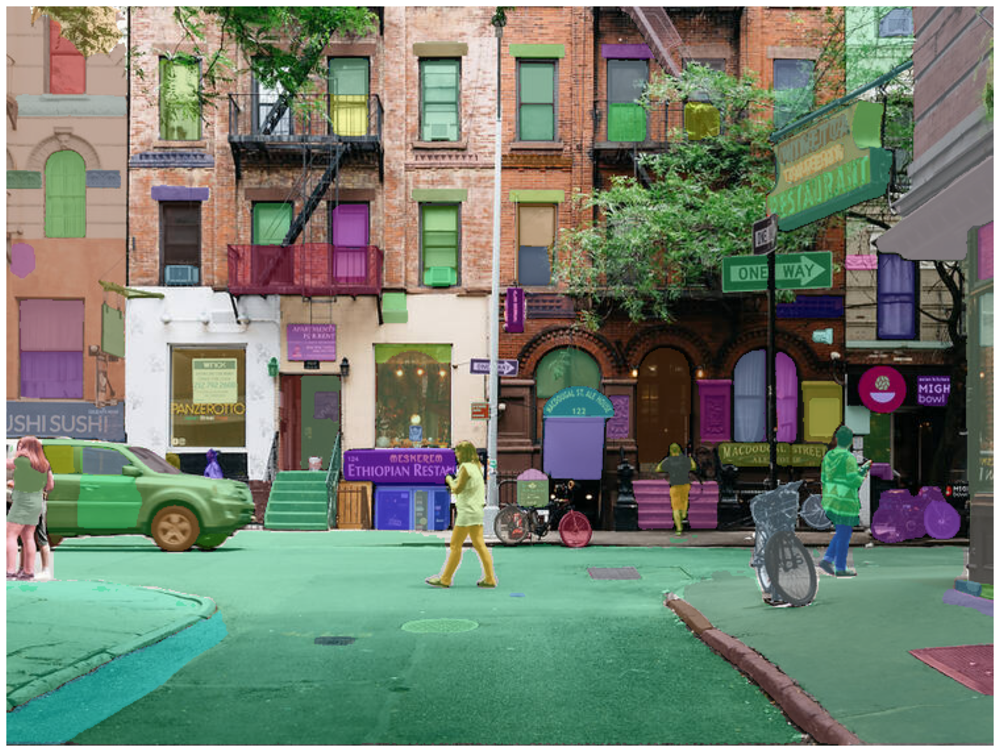

In [16]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [17]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

In [18]:
masks2 = mask_generator_2.generate(image)

In [19]:
len(masks2)

289

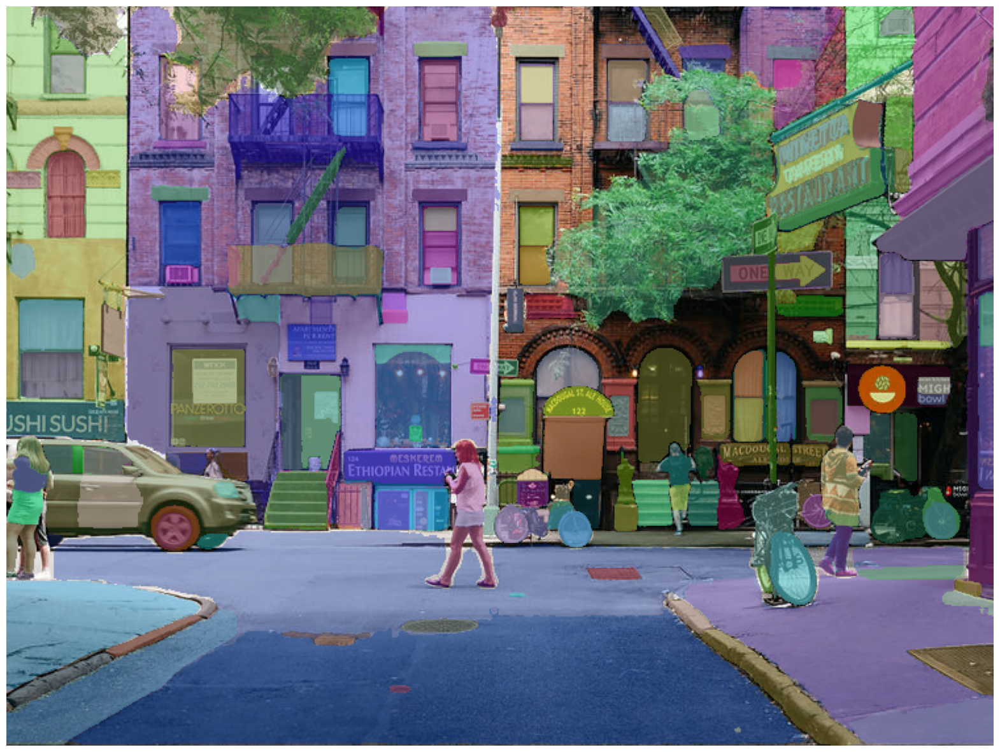

In [20]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks2)
plt.axis('off')
plt.show() 